# Cartes statiques avec `Map` — guide pas à pas

`Map` assemble une carte prête à exporter à partir de `GeoDataFrame` et de
rasters. Ce notebook déroule les étapes, une par une :

| # | Étape | Méthodes |
|---|-------|----------|
| 1 | Créer une carte | `Map()` |
| 2 | Dimensions / format | `figsize`, `dpi`, `PAPER_SIZES` |
| 3 | Données vectorielles | `add_polygons`, `add_lines` |
| 4 | Points | `add_points` |
| 5 | Données raster | `add_raster` |
| 6 | Fond de carte web | `add_basemap` |
| 7 | Flèche du Nord | `add_north_arrow` |
| 8 | Barre d'échelle | `add_scale_bar` |
| 9 | Grille de coordonnées | `add_gridlines` |
| 10 | Mini-carte de situation | `add_inset_map` |
| 11 | Légende + barre de couleurs | `add_colorbar` |
| 12 | Légende personnalisée | `add_legend_element` |
| 13 | Légende à pastilles | `add_swatch_legend` |
| 14 | Texte et annotations | `add_text`, `add_annotation` |
| 15 | Étiquettes | `add_labels` |
| 16 | Étiquettes personnalisées | `add_labels(custom_label=...)` |
| 17 | Image / logo | `add_image` |
| 18 | Image de fond | `add_background_image` |
| 19 | Couleur de fond | `set_background_color` |
| 20 | Flèches libres | `add_fig_arrow` |
| 21 | Styles graphiques | `cp.set_style` |
| 22 | Palettes | `cp.load_cmap`, `cp.get_available_palettes` |
| 23 | Polices | `cp.google_font` |
| 24 | Export multi-formats | `save` (.png/.svg/.pdf) |

In [1]:
import logging
import sys
from pathlib import Path

sys.path.insert(0, str(Path.cwd().parent))
logging.basicConfig(level=logging.WARNING)   # on masque les messages verbeux

import numpy as np
import matplotlib.pyplot as plt
import cartograpy as cp
from cartograpy import centroids, load_cmap
from cartograpy.data import Bound, DEM

bound = Bound()
civ = bound.get_country("CIV").set_crs("EPSG:4326")
regions = bound.get_admin("CIV", adm=1).set_crs("EPSG:4326")
voisins = bound.get_neighbors("CIV")

regions["aire_km2"] = regions.to_crs("EPSG:32630").area / 1e6
frontieres = regions.copy()
frontieres["geometry"] = regions.geometry.boundary          # polygones -> lignes
centres = centroids(regions.to_crs("EPSG:32630")).to_crs("EPSG:4326")
centres["taille"] = 25 + centres["aire_km2"] / centres["aire_km2"].max() * 400

# un petit raster (MNT) pour l'étape 5
DEM_BBOX = (-7.65, 7.25, -7.35, 7.55)
dem_tif = str(DEM(work_dir="_dem_cache").download(DEM_BBOX, out_tif="_dem_cache/man.tif"))

# emprise CIV au format set_extent : [ouest, est, sud, nord]
w, s, e, n = civ.total_bounds
CIV_EXTENT = [w, e, s, n]
print(len(regions), "régions -", len(voisins), "pays voisins - raster :", dem_tif)

C:\Users\Ordinateur\AppData\Roaming\uv\python\cpython-3.12-windows-x86_64-none\Lib\importlib\metadata\__init__.py:467: DeprecationWarning: Implicit None on return values is deprecated and will raise KeyErrors.
  return self.metadata['Version']


C:\Users\Ordinateur\OneDrive\cartograpy\.venv\Lib\site-packages\pandas\core\generic.py:6335: DeprecationWarning: Overriding the CRS of a GeoDataFrame that already has CRS. This unsafe behavior will be deprecated in future versions. Use GeoDataFrame.set_crs method instead
  return object.__setattr__(self, name, value)


Téléchargement DEM:   0%|          | 0/1 [00:00<?, ?tuile/s]

Téléchargement DEM: 100%|██████████| 1/1 [00:04<00:00,  4.63s/tuile]

Téléchargement DEM: 100%|██████████| 1/1 [00:04<00:00,  4.63s/tuile]

14 régions - 5 pays voisins - raster : _dem_cache\man.tif


## 1. Créer une carte

`Map()` crée une figure avec une projection cartopy (`PlateCarree` par
défaut) et, si `basemap=True`, un fond côtes + frontières.

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.50


   Ratio données: 1.33


   Étendue: [-25.65, 25.65, -12.10, 22.10]


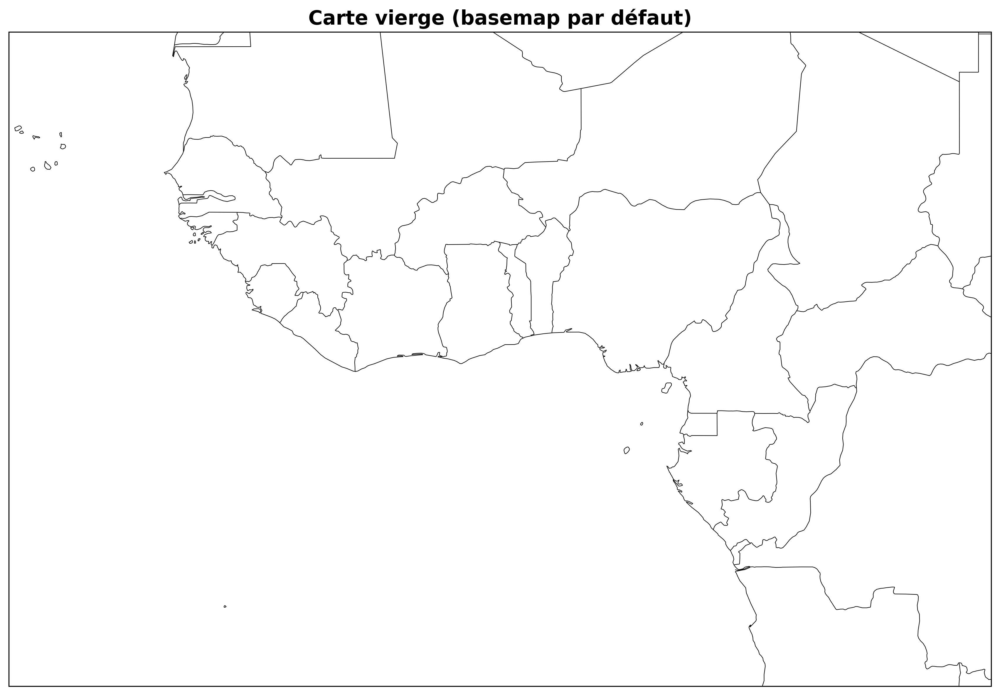

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.50


   Ratio données: 0.96


   Étendue: [-11.02, -0.11, 3.90, 11.17]


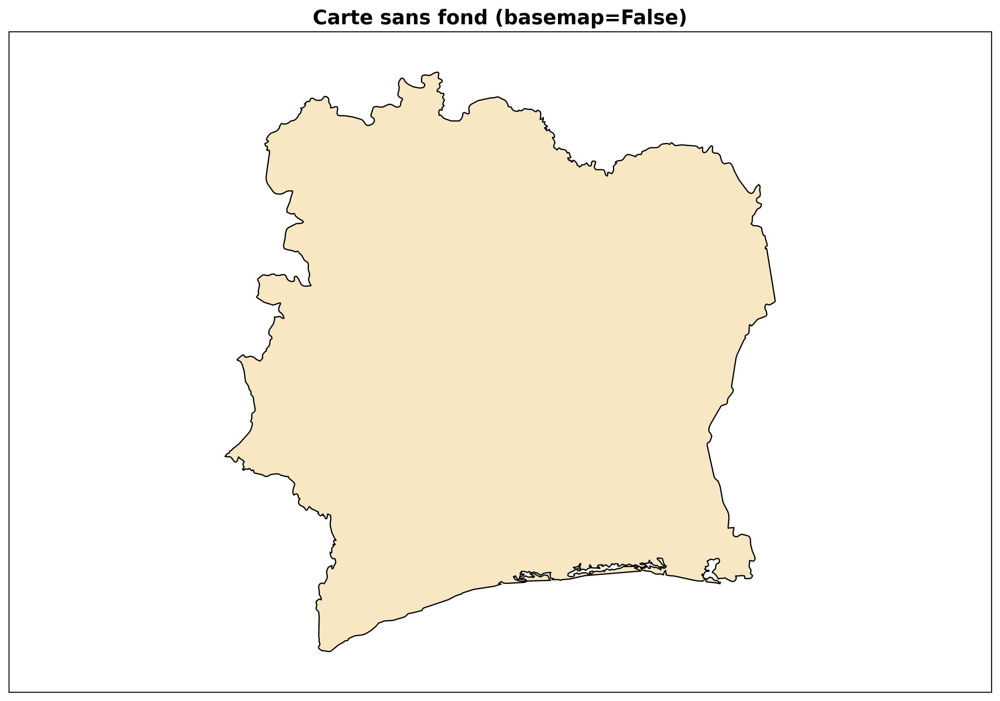

In [2]:
m = cp.Map(title="Carte vierge (basemap par défaut)")
m.set_extent([-20, 20, -10, 20])
m.show()

m = cp.Map(title="Carte sans fond (basemap=False)", basemap=False)
m.add_polygons(civ, facecolor="#f6e7c1", edge_color="black", alpha=1)
m.show()

## 2. Modifier les dimensions et le format

`figsize` : un tuple `(largeur, hauteur)` en pouces, un format papier
(`"A4"`, `"A3"`, `"B2"`…) ou un dict `{"paper": ..., "orientation": ...}`.
`dpi` fixe la résolution.

formats disponibles : ['4A0', '2A0', 'A0', 'A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10', 'B0'] …
A4 = (210, 297) mm
📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.50


   Ratio données: 0.96


   Étendue: [-11.02, -0.11, 3.90, 11.17]


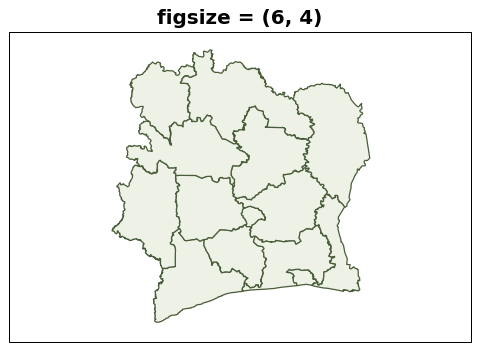

📄 Format de papier: A5 (landscape) - Dimensions: 210 x 148 mm - Figure: 8.3" x 5.8"


📊 Centrage intelligent appliqué:


   Format: A5 (landscape)


   Ratio figure: 1.42


   Ratio données: 0.96


   Étendue: [-11.00, -0.13, 3.71, 11.36]


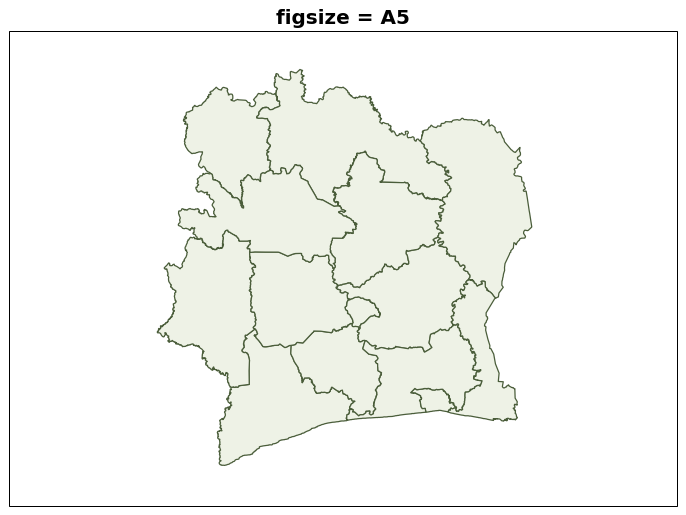

📄 Format de papier: A4 (landscape) - Dimensions: 297 x 210 mm - Figure: 11.7" x 8.3"


📊 Centrage intelligent appliqué:


   Format: A4 (landscape)


   Ratio figure: 1.41


   Ratio données: 0.96


   Étendue: [-10.98, -0.15, 3.71, 11.36]


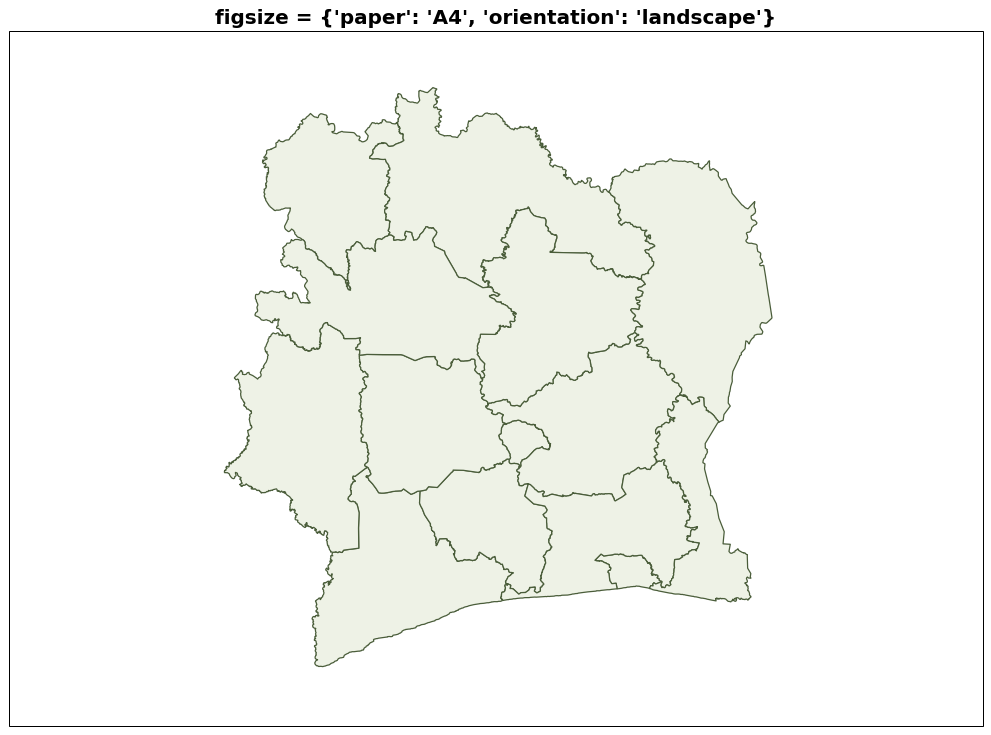

In [3]:
print("formats disponibles :", list(cp.Map.PAPER_SIZES)[:14], "…")
print("A4 =", cp.Map.PAPER_SIZES["A4"], "mm")

for fmt in [(6, 4), "A5", {"paper": "A4", "orientation": "landscape"}]:
    m = cp.Map(figsize=fmt, title=f"figsize = {fmt}", dpi=90, basemap=False)
    m.add_polygons(regions, facecolor="#eef2e6", edge_color="#4a5d3a", alpha=1)
    m.set_extent(CIV_EXTENT)
    m.show()

## 3. Ajouter des données vectorielles

`add_polygons` et `add_lines` empilent des couches. Style : `facecolor`,
`edge_color`, `linewidth`, `alpha`, `linestyle`.

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


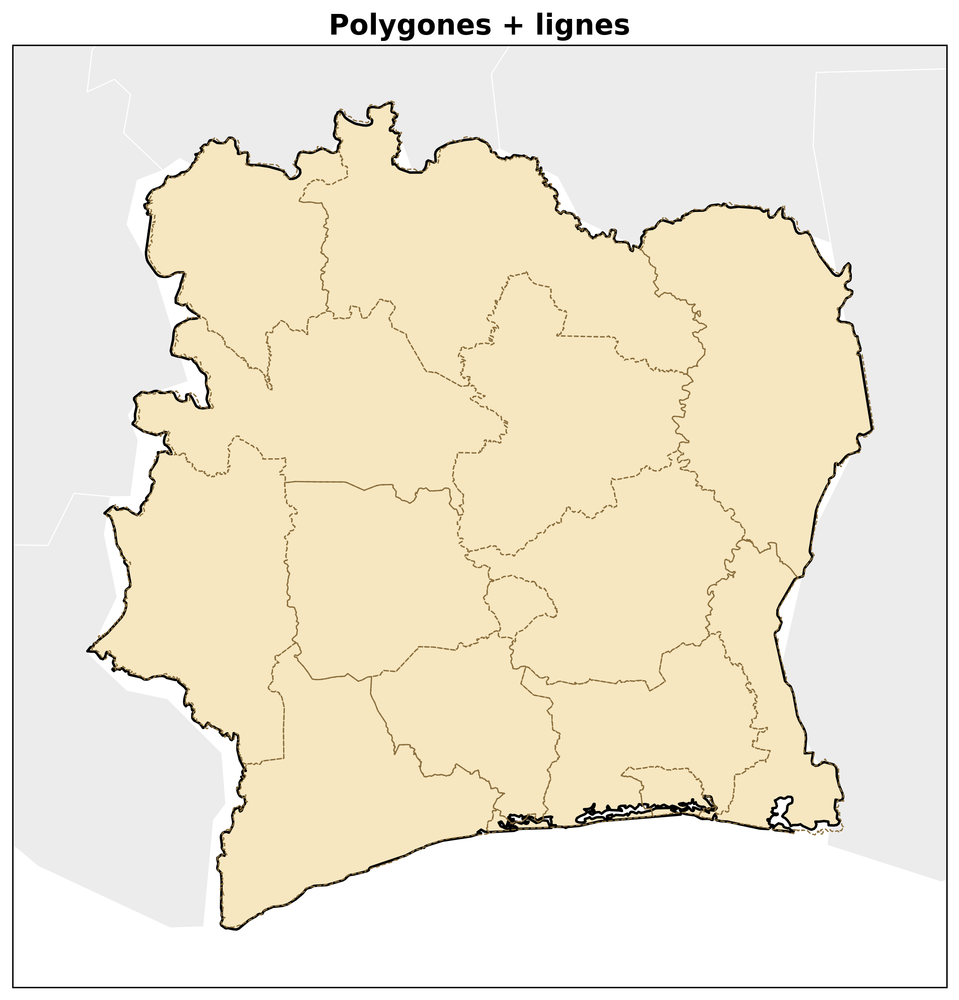

In [4]:
m = cp.Map(figsize=(8, 8), title="Polygones + lignes", basemap=False)
m.add_polygons(voisins, facecolor="#ececec", edge_color="white", linewidth=0.6, alpha=1)
m.add_polygons(civ, facecolor="#f6e7c1", edge_color="black", linewidth=1.4, alpha=1)
m.add_lines(frontieres, color="#8a6d3b", linewidth=0.7, linestyle="--")
m.set_extent(CIV_EXTENT)
m.show()

## 4. Ajouter des points

`add_points` : points simples, **classés** (`column=`) ou **proportionnels**
(`size=` = nom de colonne).

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


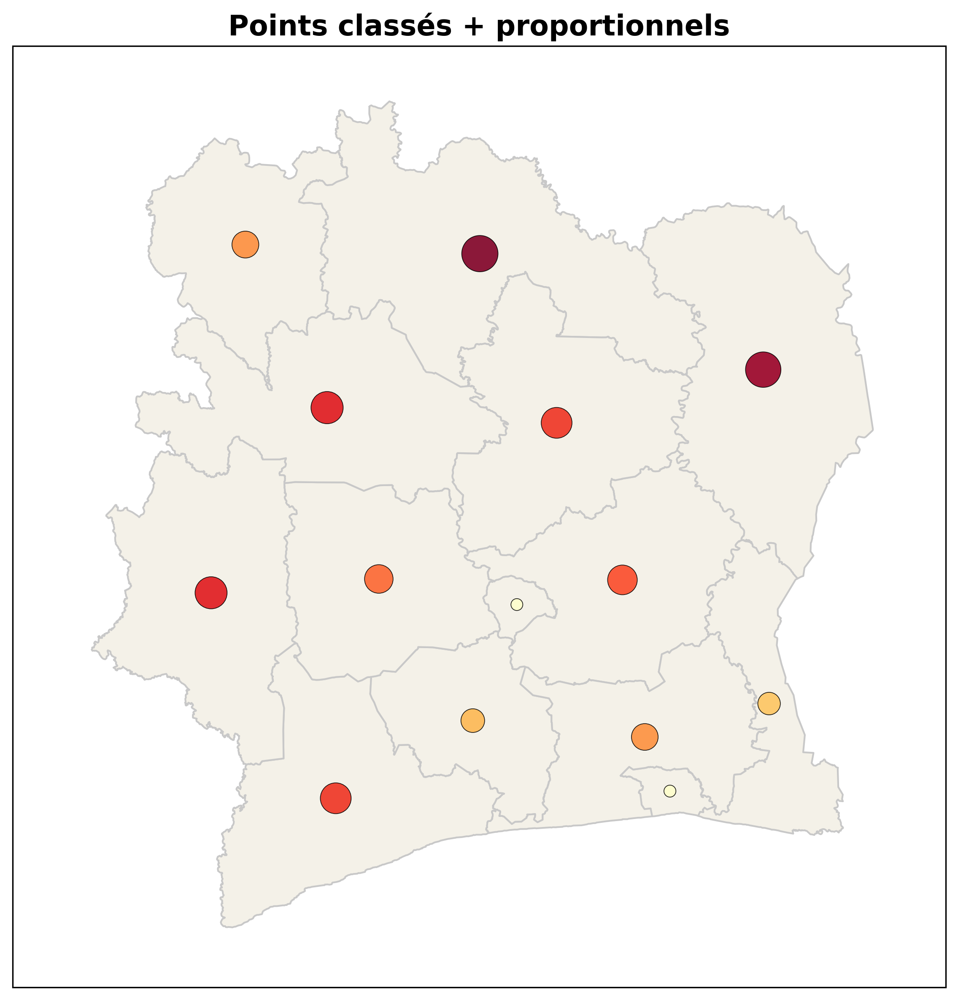

In [5]:
m = cp.Map(figsize=(8, 8), title="Points classés + proportionnels", basemap=False)
m.add_polygons(regions, facecolor="#f4f1e8", edge_color="#c8c8c8", alpha=1)
m.add_points(centres, size="taille", column="aire_km2", cmap="YlOrRd",
             edge_color="black", linewidth=0.4, alpha=0.9)
m.set_extent(CIV_EXTENT)
m.show()

## 5. Ajouter des données raster

`add_raster(raster_path=...)` place un GeoTIFF ;
`add_raster(raster_array=..., extent=..., transform=...)` un tableau NumPy.

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.14


   Ratio données: 1.00


   Étendue: [-7.70, -7.30, 7.23, 7.57]


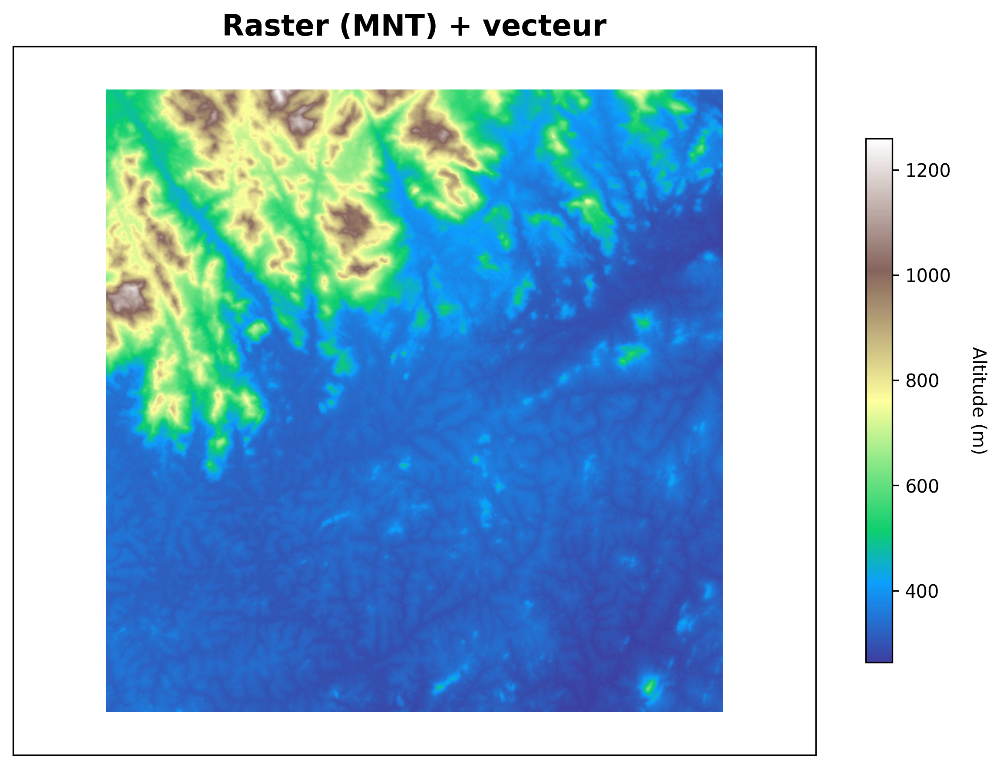

In [6]:
m = cp.Map(figsize=(8, 7), title="Raster (MNT) + vecteur", basemap=False)
m.add_raster(raster_path=dem_tif, cmap="terrain", alpha=0.95, title="Altitude (m)")
m.add_lines(frontieres, color="black", linewidth=0.8)
m.set_extent([DEM_BBOX[0], DEM_BBOX[2], DEM_BBOX[1], DEM_BBOX[3]])
m.show()

## 6. Ajouter un fond de carte web

`add_basemap()` télécharge des tuiles via `contextily`. Nécessite le
réseau ; à défaut on garde la carte sans fond.

🗺️  Fond de carte ajouté


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


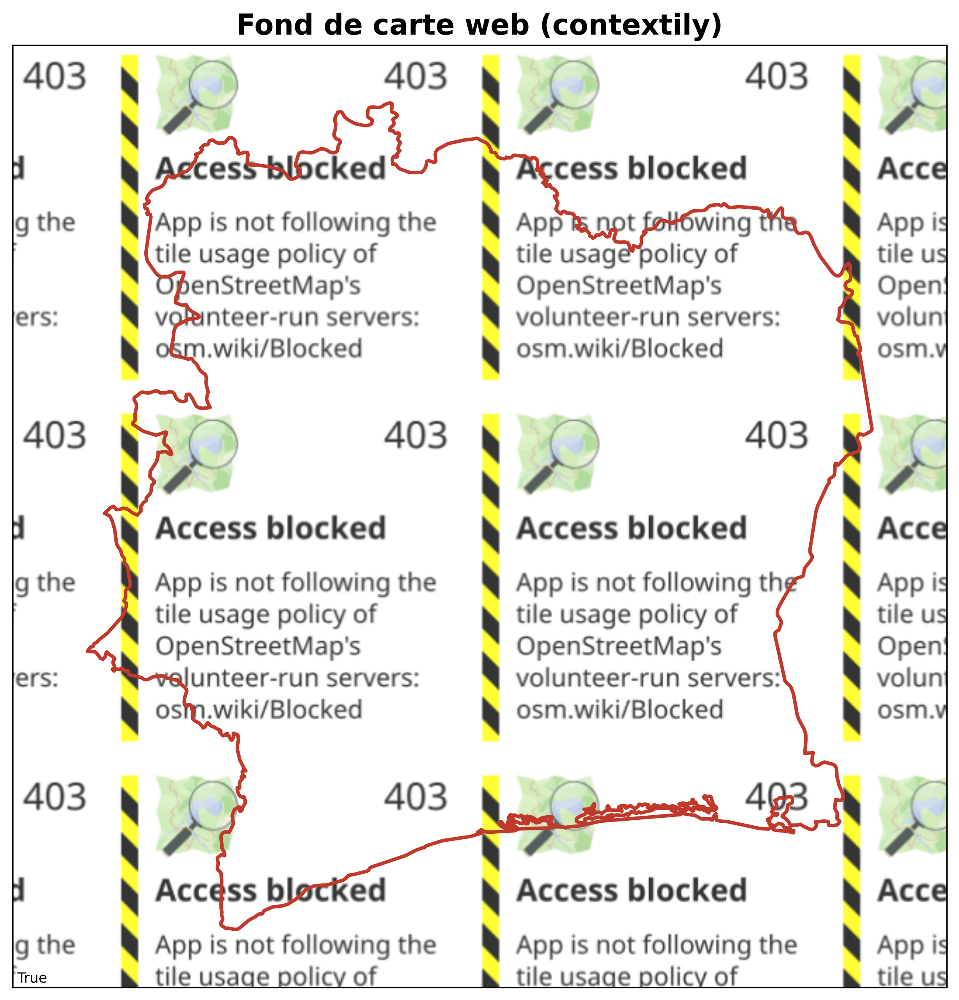

In [7]:
m = cp.Map(figsize=(8, 8), title="Fond de carte web (contextily)", basemap=False)
m.add_polygons(civ, facecolor="none", edge_color="#c0392b", linewidth=2, alpha=1)
m.set_extent(CIV_EXTENT)
try:
    m.add_basemap(alpha=0.8)
except Exception as err:
    print("add_basemap indisponible :", err)
m.show()

## 7. Ajouter la flèche du Nord

`add_north_arrow()` : rendu pro via `matplotlib-map-utils` si présent.
Paramètres : `location`, `arrow` (SVG embarqué), `rotation`, `label`,
`fancy`, `to="ax"|"fig"`.

🧭 Flèche du Nord ajoutée (map-utils)


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


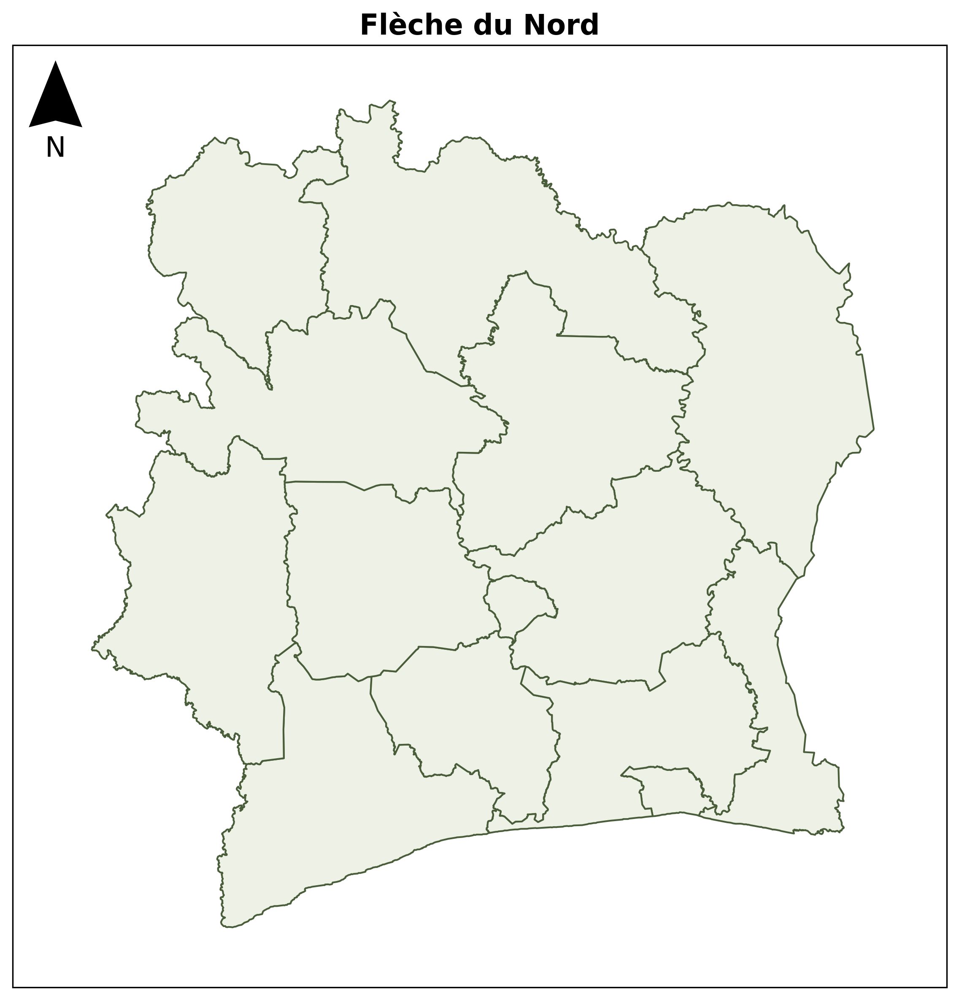

In [8]:
m = cp.Map(figsize=(8, 8), title="Flèche du Nord", basemap=False)
m.add_polygons(regions, facecolor="#eef2e6", edge_color="#4a5d3a", alpha=1)
m.add_north_arrow(location="upper left")
m.set_extent(CIV_EXTENT)
m.show()

## 8. Ajouter la barre d'échelle

`add_scale_bar()` : longueur auto ou `length=`, `location=`, `units=`,
`bar_style="boxes"|"ticks"`, `font=`.

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


C:\Users\Ordinateur\OneDrive\cartograpy\.venv\Lib\site-packages\matplotlib_map_utils\core\scale_bar.py:781: UserWarning: Provided CRS EPSG:4326 uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.
  warnings.warn(f"Provided CRS {bar_projection} uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.")
C:\Users\Ordinateur\OneDrive\cartograpy\.venv\Lib\site-packages\matplotlib_map_utils\core\scale_bar.py:853: UserWarning: Provided bar length (200) is greater than the axis length (7.378750978409791 inches); setting bar length to default (25% of axis length).
  warnings.warn(f"Provided bar length ({bar_length}) is greater than the axis length ({ax_inches} inches); setting bar length to default (25% of axis length).")
C:\Users\Ordinateur\OneDrive\cartograpy\.venv\Lib\site-packages\matplotlib_map_utils\core\scale_ba

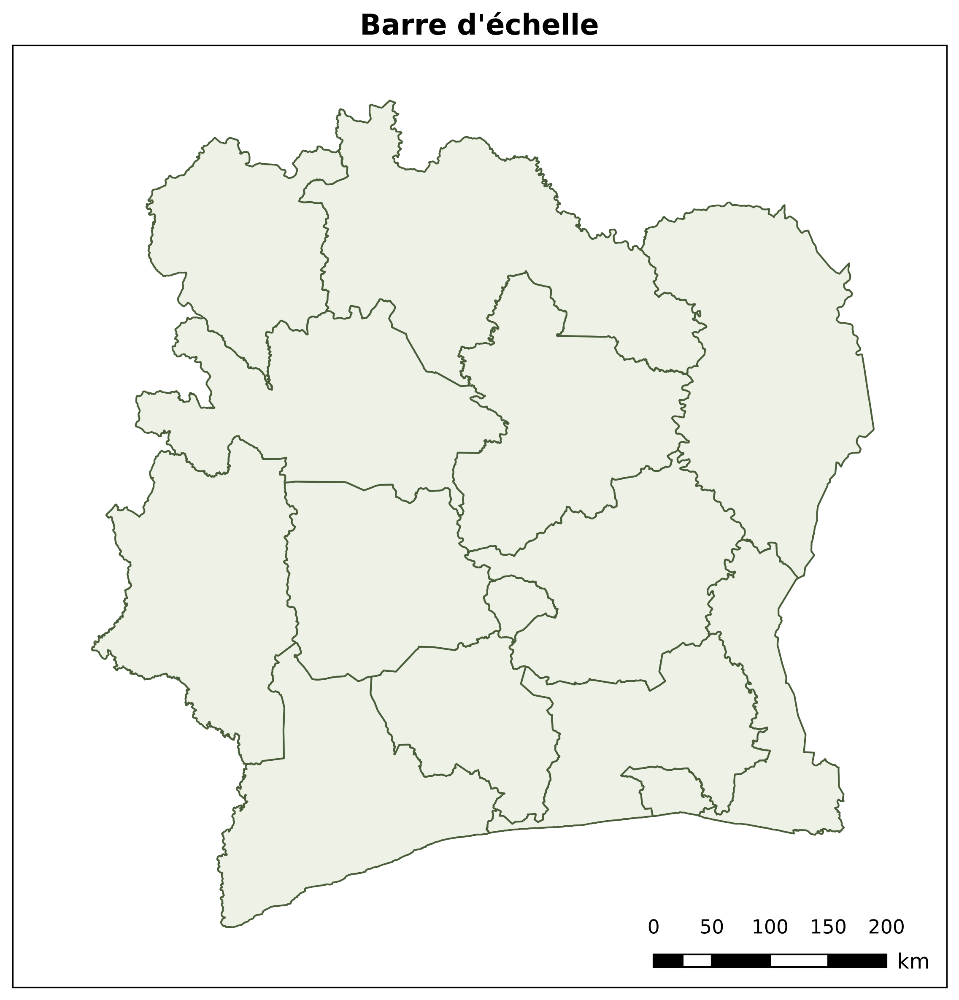

In [9]:
m = cp.Map(figsize=(8, 8), title="Barre d'échelle", basemap=False)
m.add_polygons(regions, facecolor="#eef2e6", edge_color="#4a5d3a", alpha=1)
m.add_scale_bar(length=200, location="lower right", units="km")
m.set_extent(CIV_EXTENT)
m.show()

## 9. Ajouter la grille de coordonnées

`add_gridlines()` : `draw_labels`, `xlocs`/`ylocs`, `dms`, `color`,
`linestyle`, `alpha`, `fontsize`.

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


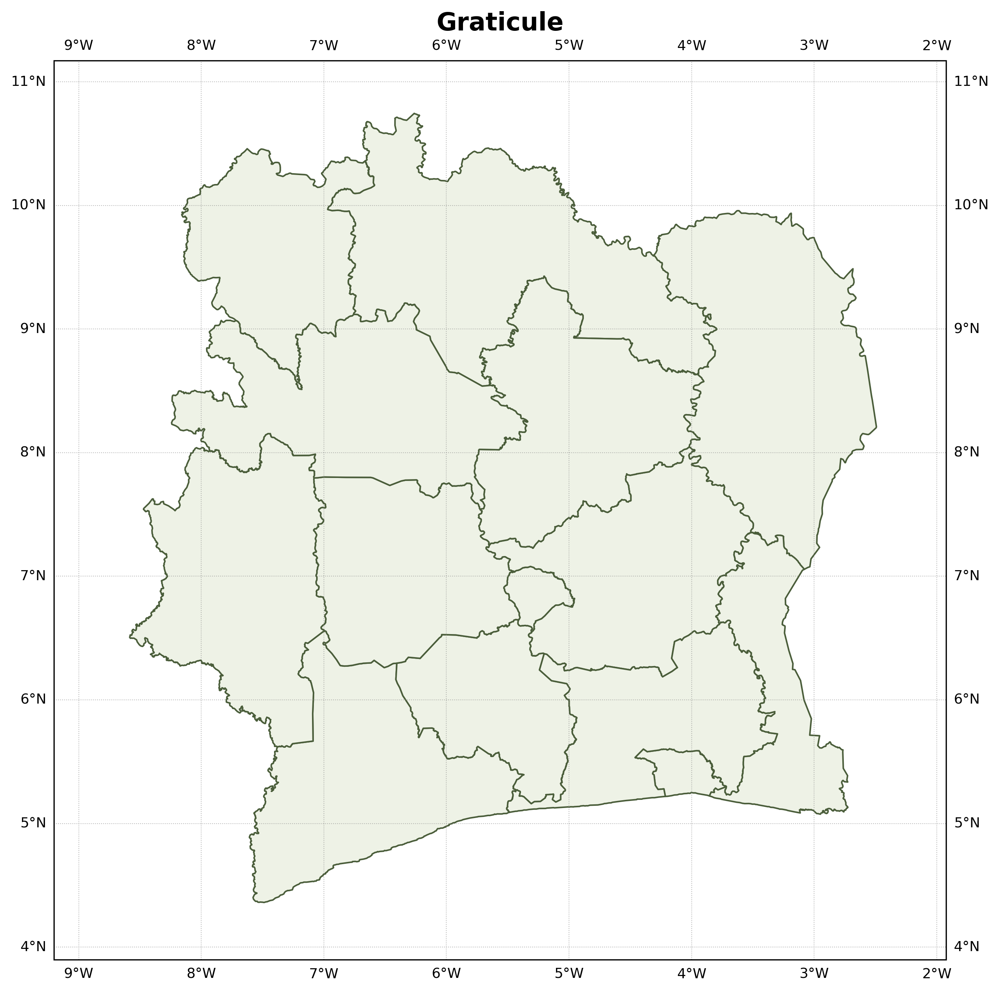

In [10]:
m = cp.Map(figsize=(9, 9), title="Graticule", basemap=False)
m.add_polygons(regions, facecolor="#eef2e6", edge_color="#4a5d3a", alpha=1)
m.add_gridlines(color="gray", linestyle=":", alpha=0.6, fontsize=9)
m.set_extent(CIV_EXTENT)
m.show()

## 10. Ajouter une mini-carte de situation

`add_inset_map(data=..., on=..., zoom_to_on=True)` place la zone d'étude
dans un contexte plus large.

🧭 Flèche du Nord ajoutée (map-utils)


🔍 Carte de situation ajoutée (map-utils)


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


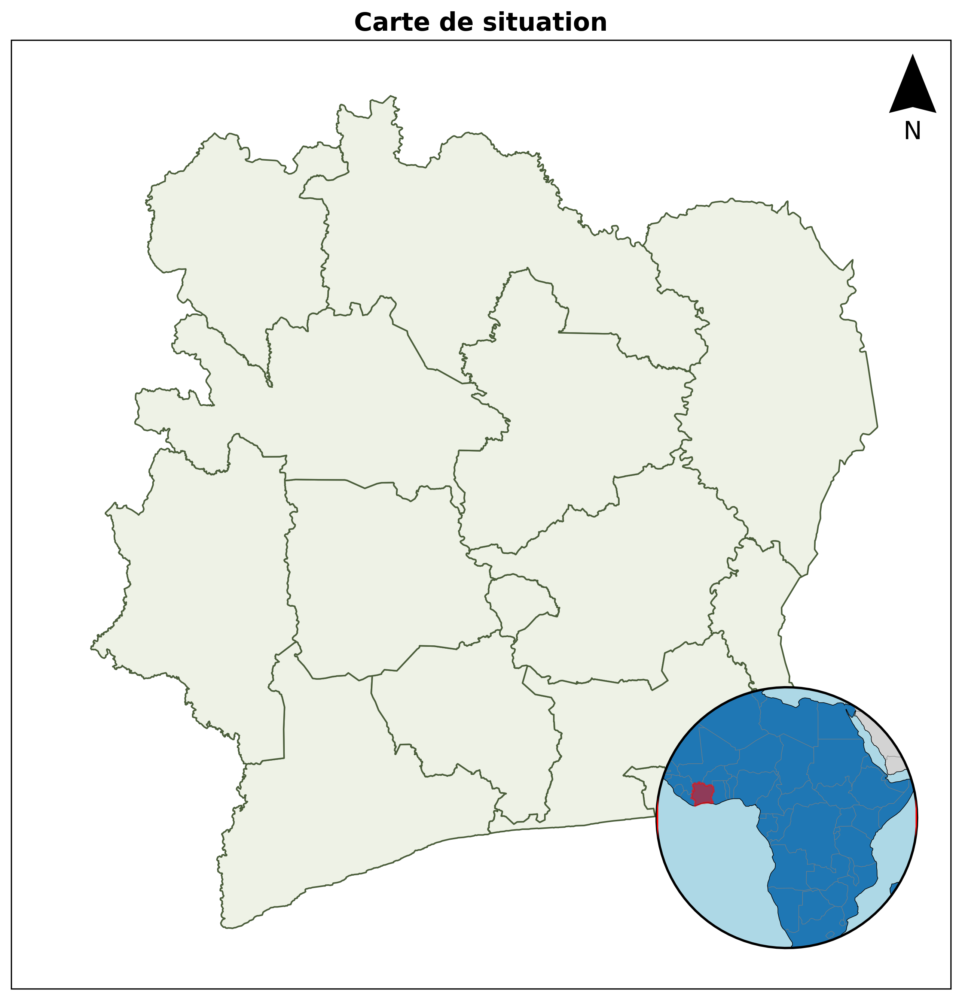

In [11]:
m = cp.Map(figsize=(9, 9), title="Carte de situation", basemap=False)
m.add_polygons(regions, facecolor="#eef2e6", edge_color="#4a5d3a", alpha=1)
m.add_north_arrow()
m.set_extent(CIV_EXTENT)
try:
    m.add_inset_map(data=civ, mode="geometry",
                    on=bound.get_continent("Afrique"), zoom_to_on=True,
                    circular=True, position=(0.03, 0.03, 0.30, 0.30))
except Exception as err:
    print("add_inset_map indisponible :", err)
m.show()

## 11. Légende automatique et barre de couleurs

Un `add_polygons_choropleth` produit sa légende au rendu. `add_colorbar`
ajoute une barre de couleurs **autonome**.

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.95


   Étendue: [-9.18, -1.90, 3.91, 11.19]


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


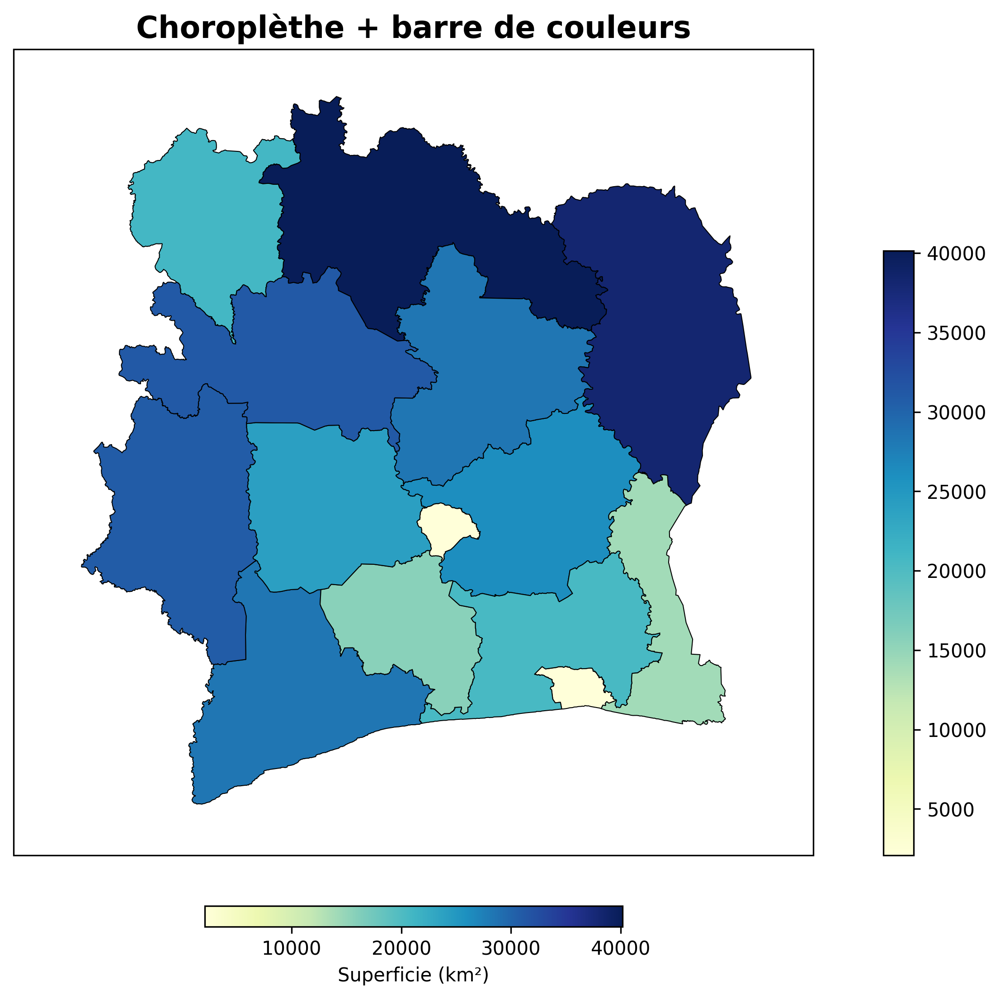

In [12]:
m = cp.Map(figsize=(8, 8), title="Choroplèthe + barre de couleurs", basemap=False)
m.add_polygons_choropleth(regions, column_to_plot="aire_km2", cmap="YlGnBu", show_labels=False)
m.add_colorbar(cmap="YlGnBu", vmin=regions["aire_km2"].min(), vmax=regions["aire_km2"].max(),
               label="Superficie (km²)", orientation="horizontal", shrink=0.5)
m.set_extent(CIV_EXTENT)
m.show()

## 12. Légende personnalisée

`add_legend_element(type, label, ...)` ajoute des entrées sur mesure
(`"point"`, `"line"`, `"patch"`).

➕ Élément 'Côte d'Ivoire' ajouté à la légende


➕ Élément 'Limites régionales' ajouté à la légende


➕ Élément 'Chef-lieu' ajouté à la légende


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


🛑Element de légende ajouté None


✅ Légende personnalisée créée avec 3 éléments


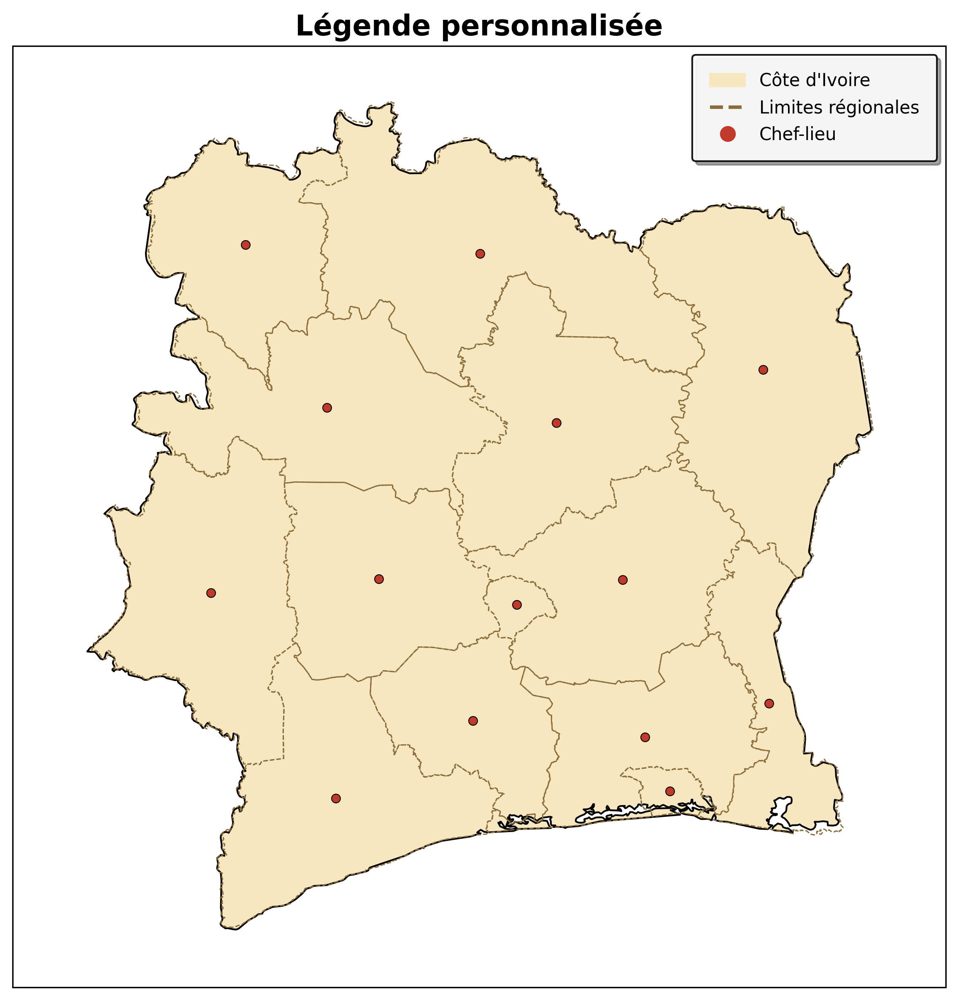

In [13]:
m = cp.Map(figsize=(8, 8), title="Légende personnalisée", basemap=False)
m.add_polygons(civ, facecolor="#f6e7c1", edge_color="black", alpha=1)
m.add_lines(frontieres, color="#8a6d3b", linewidth=0.7, linestyle="--")
m.add_points(centres, color="#c0392b", size=25)
m.add_legend_element("patch", "Côte d'Ivoire", color="#f6e7c1")
m.add_legend_element("line", "Limites régionales", color="#8a6d3b", linestyle="--")
m.add_legend_element("point", "Chef-lieu", color="#c0392b")
m.set_extent(CIV_EXTENT)
m.show()

## 13. Légende à pastilles

`add_swatch_legend(items, xy)` dessine des rectangles de couleur empilés,
positionnés en coordonnées géographiques (style carte imprimée).

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.95


   Étendue: [-9.18, -1.90, 3.91, 11.19]


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


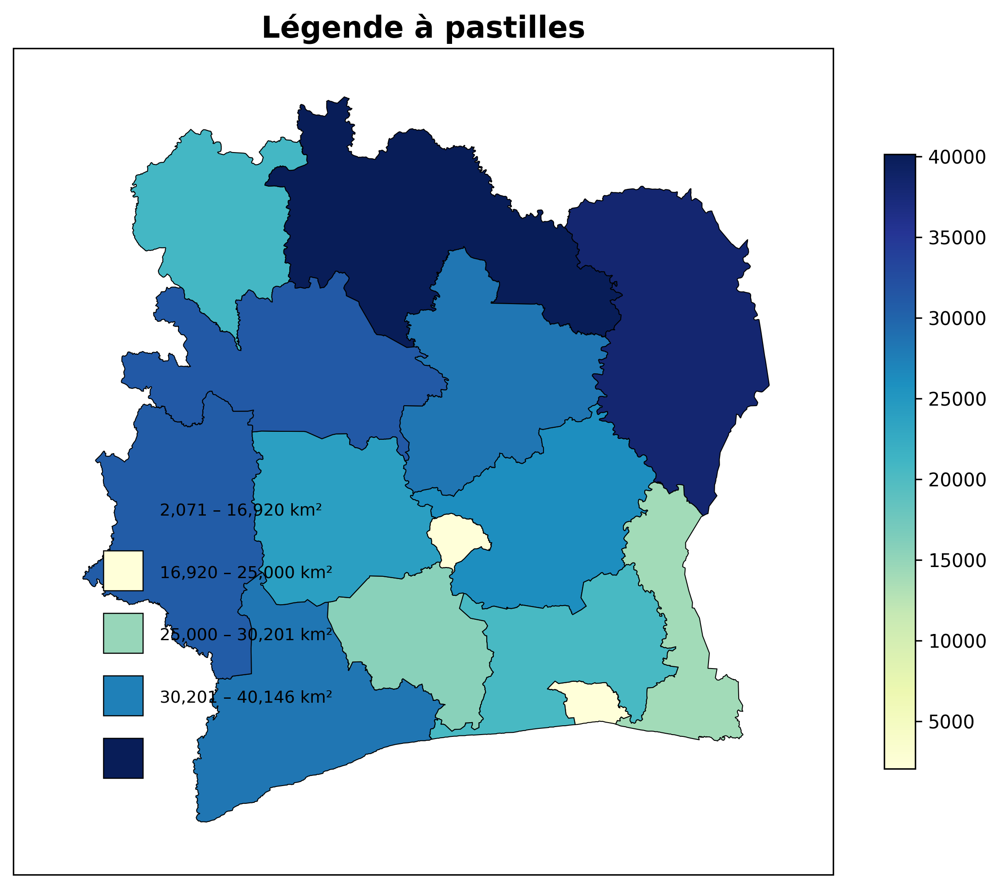

In [14]:
cmap = plt.get_cmap("YlGnBu")
bornes = np.quantile(regions["aire_km2"], np.linspace(0, 1, 5))
items = [(f"{bornes[i]:,.0f} – {bornes[i+1]:,.0f} km²", cmap(i / 3)) for i in range(4)]

m = cp.Map(figsize=(8, 8), title="Légende à pastilles", basemap=False)
m.add_polygons_choropleth(regions, column_to_plot="aire_km2", cmap="YlGnBu", show_labels=False)
m.add_swatch_legend(items, xy=(-8.4, 6.4), rect_width=0.35, rect_height=0.35,
                    y_step=0.55, label_dx=0.5, fontsize=9)
m.set_extent(CIV_EXTENT)
m.show()

## 14. Ajouter du texte et des annotations

`add_text(text, xy)` place du texte aux coordonnées géographiques ;
`add_annotation(text, xy, xytext, arrow=True)` ajoute une flèche vers un
point.

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


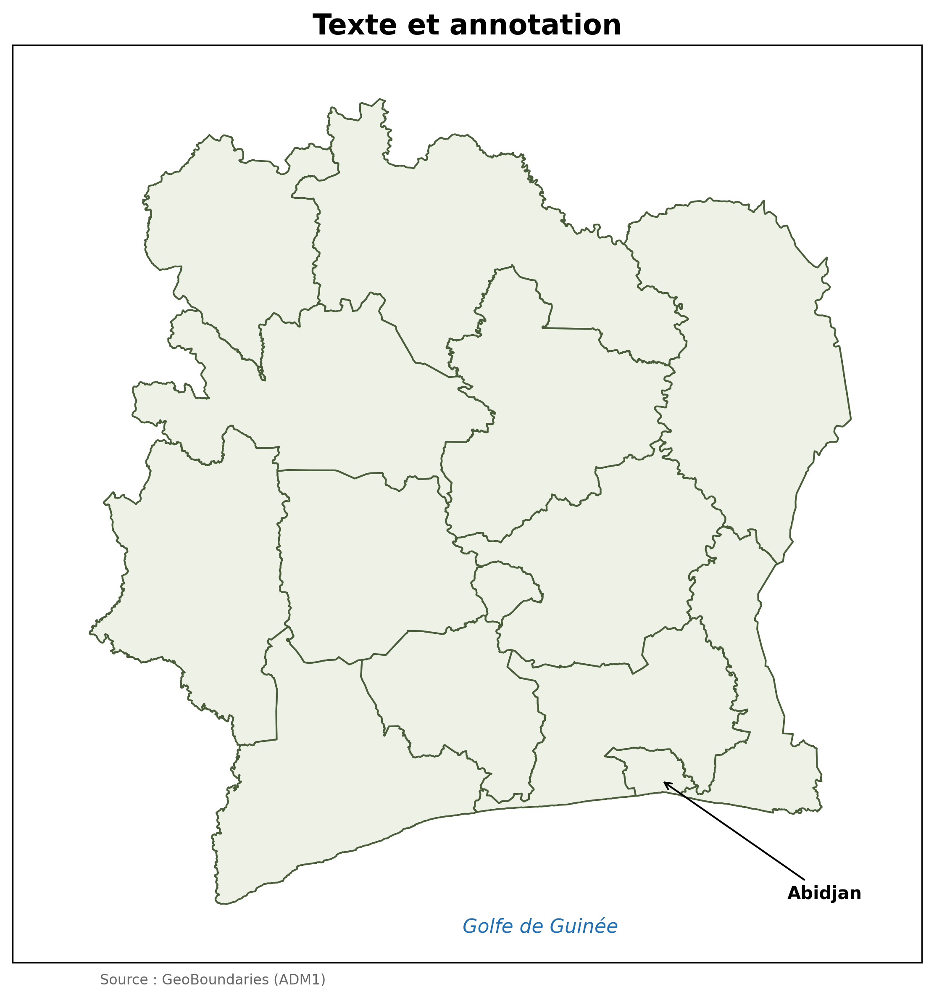

In [15]:
m = cp.Map(figsize=(8, 8), title="Texte et annotation", basemap=False)
m.add_polygons(regions, facecolor="#eef2e6", edge_color="#4a5d3a", alpha=1)
m.add_text("Golfe de Guinée", xy=(-5.6, 4.1), fontsize=11, color="#1f6fb2", style="italic")
m.add_text("Source : GeoBoundaries (ADM1)", xy=(-8.5, 3.7), fontsize=8, color="#666666")
m.add_annotation("Abidjan", xy=(-4.02, 5.35), xytext=(-3.0, 4.4),
                 text_kwargs=dict(fontsize=10, fontweight="bold"))
m.set_extent(CIV_EXTENT)
m.show()

## 15. Ajouter des étiquettes

`add_labels(gdf, label_column=...)` écrit une colonne au centroïde des
polygones (ou sur les points).

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


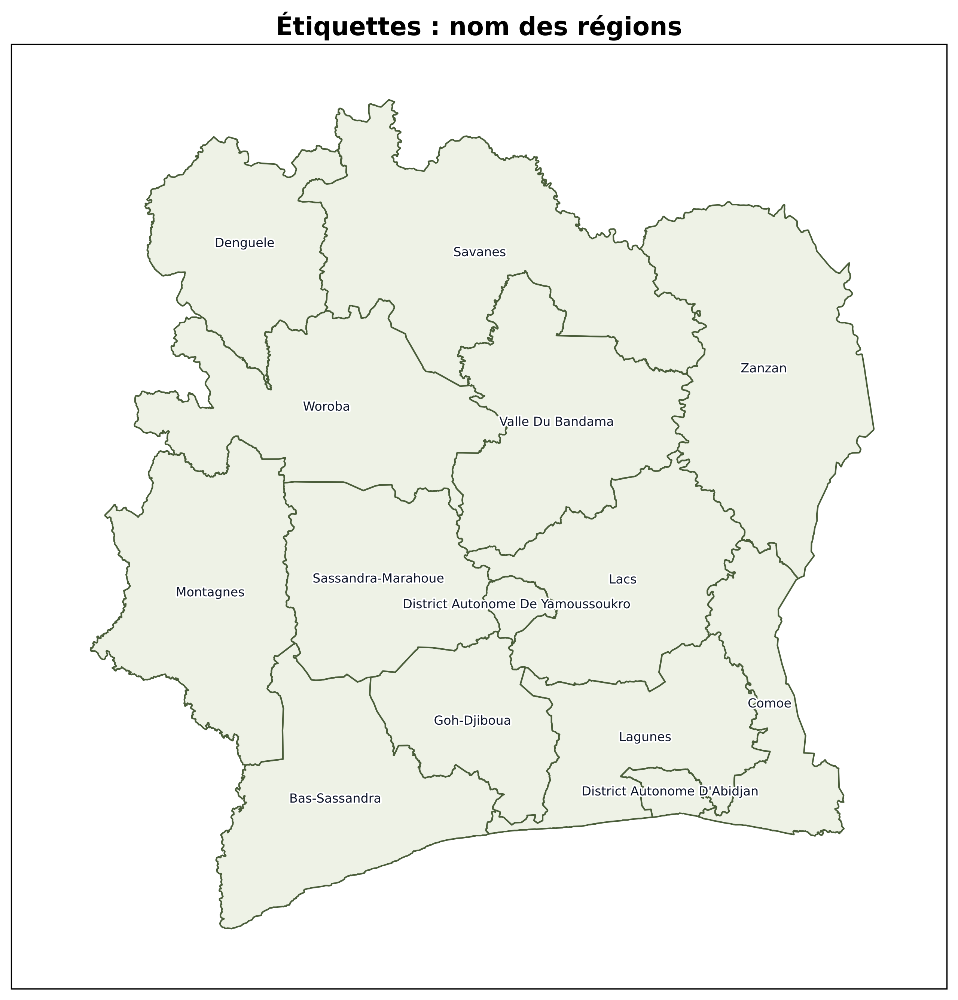

In [16]:
m = cp.Map(figsize=(9, 9), title="Étiquettes : nom des régions", basemap=False)
m.add_polygons(regions, facecolor="#eef2e6", edge_color="#4a5d3a", alpha=1)
m.add_labels(regions, label_column="shapeName", fontsize=8)
m.set_extent(CIV_EXTENT)
m.show()

## 16. Personnaliser les étiquettes

`custom_label` (fonction), `filter_column` / `filter_values` (n'étiqueter
que certaines entités), `outline_width` / `outline_color` (halo),
`color`, `fontsize`.

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.95


   Étendue: [-9.18, -1.90, 3.91, 11.19]


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


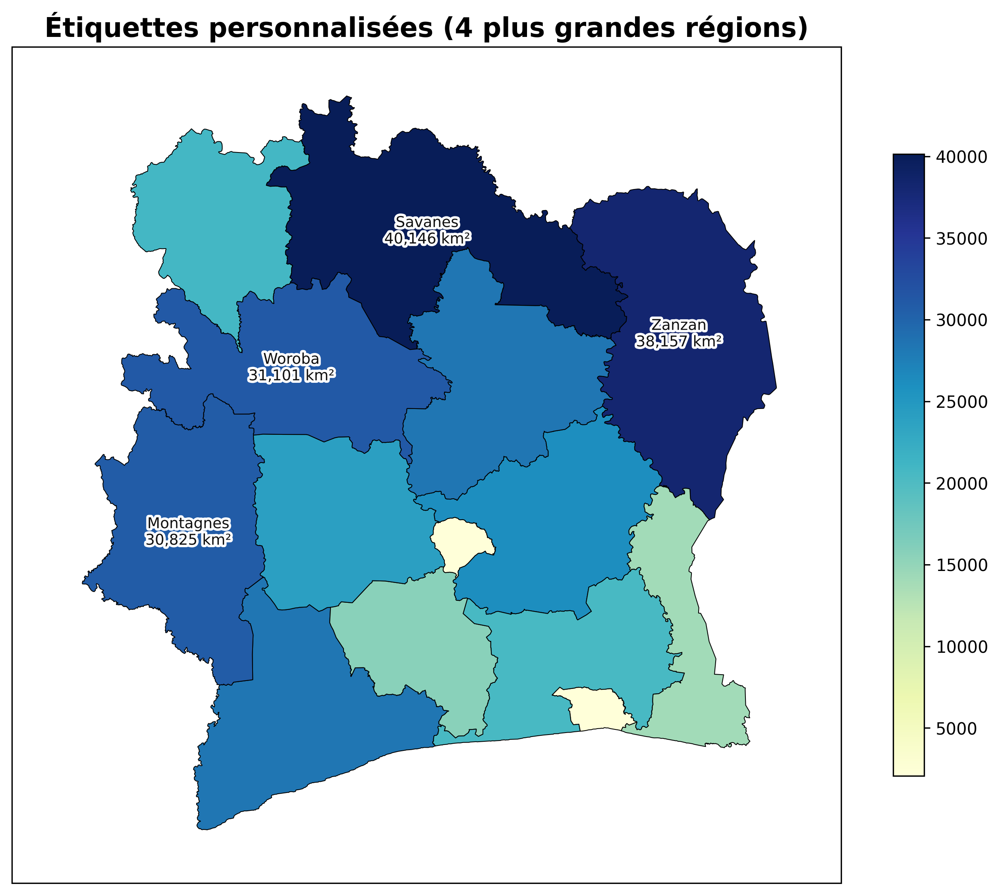

In [17]:
grandes = regions.nlargest(4, "aire_km2")["shapeName"].tolist()

m = cp.Map(figsize=(9, 9), title="Étiquettes personnalisées (4 plus grandes régions)", basemap=False)
m.add_polygons_choropleth(regions, column_to_plot="aire_km2", cmap="YlGnBu", show_labels=False)
m.add_labels(
    regions,
    custom_label=lambda r: f"{r['shapeName']}\n{r['aire_km2']:,.0f} km²",
    filter_column="shapeName", filter_values=grandes,
    fontsize=9, color="#101010", outline_width=3, outline_color="white",
)
m.set_extent(CIV_EXTENT)
m.show()

## 17. Ajouter une image / un logo

`add_image(image, xy, to="fig")` colle une image (logo, photo) à une
position en coordonnées figure (0–1) ou axe.

🖼️ Image ajoutée


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


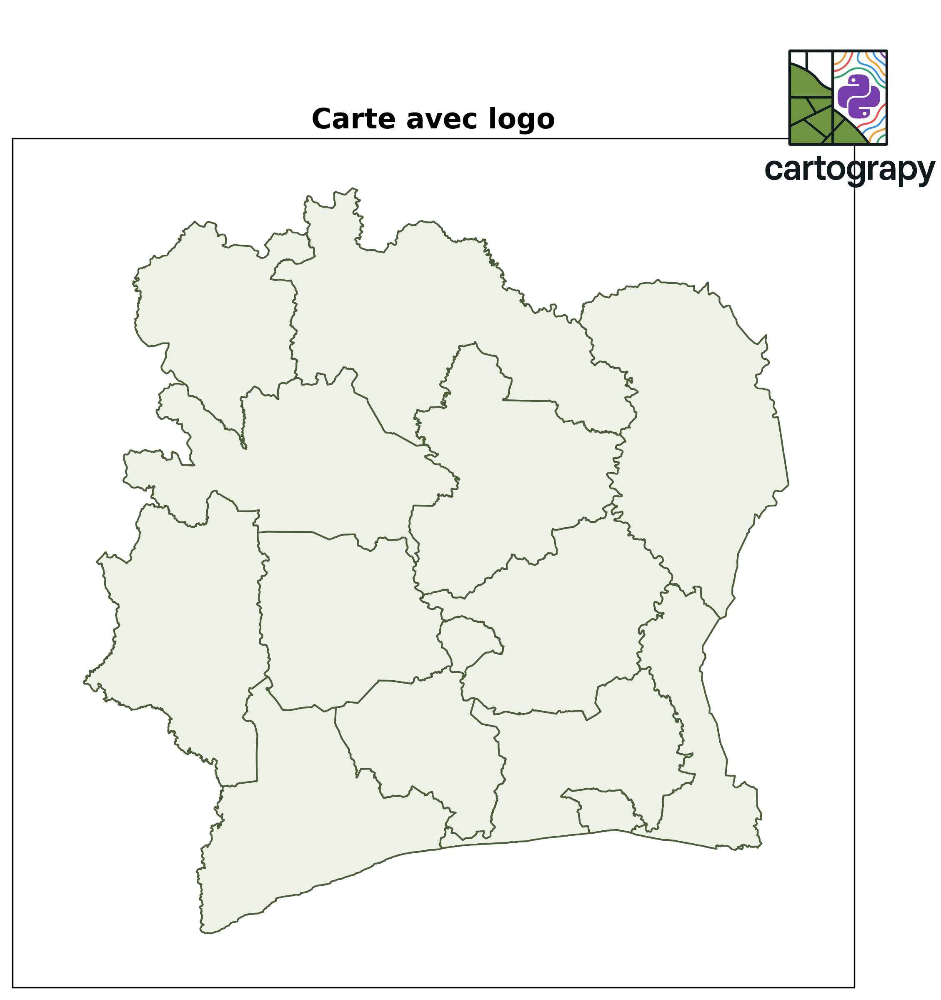

In [18]:
m = cp.Map(figsize=(8, 8), title="Carte avec logo", basemap=False)
m.add_polygons(regions, facecolor="#eef2e6", edge_color="#4a5d3a", alpha=1)
m.set_extent(CIV_EXTENT)
try:
    m.add_image("logo.png", xy=(0.85, 0.88), to="fig", zoom=0.12)
except Exception as err:
    print("add_image indisponible :", err)
m.show()

## 18. Ajouter une image de fond

`add_background_image(image, extent=...)` place une image derrière toutes
les couches, sur l'emprise indiquée (coordonnées géographiques).

🖼️ Image de fond ajoutée


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.91, 3.90, 11.19]


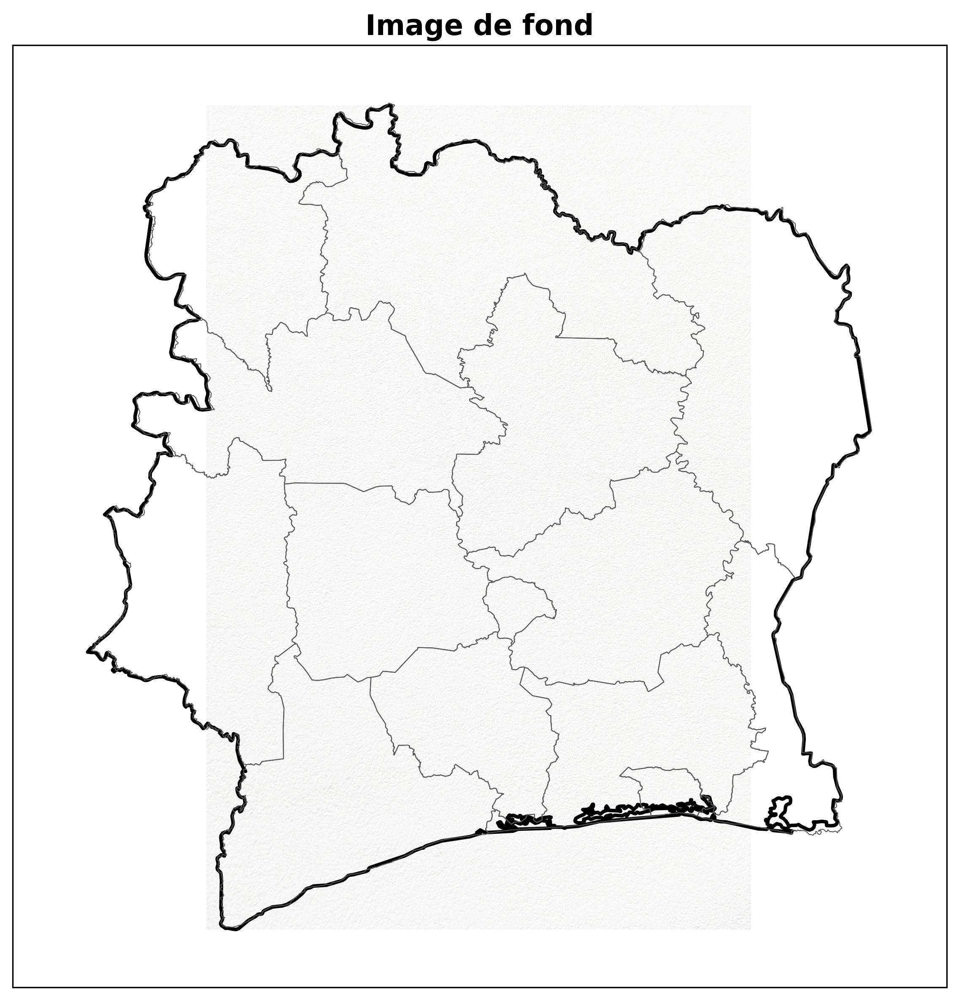

In [19]:
m = cp.Map(figsize=(8, 8), title="Image de fond", basemap=False)
m.set_extent(CIV_EXTENT)
try:
    m.add_background_image("bg_image.jpg", extent=tuple(civ.total_bounds), alpha=0.5)
except Exception as err:
    print("add_background_image indisponible :", err)
m.add_polygons(civ, facecolor="none", edge_color="black", linewidth=2, alpha=1)
m.add_polygons(regions, facecolor="none", edge_color="#555555", linewidth=0.5, alpha=1)
m.show()

## 19. Modifier la couleur de fond

`set_background_color(color)` colore l'axe **et** la figure (rendu sombre,
charte graphique…).

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


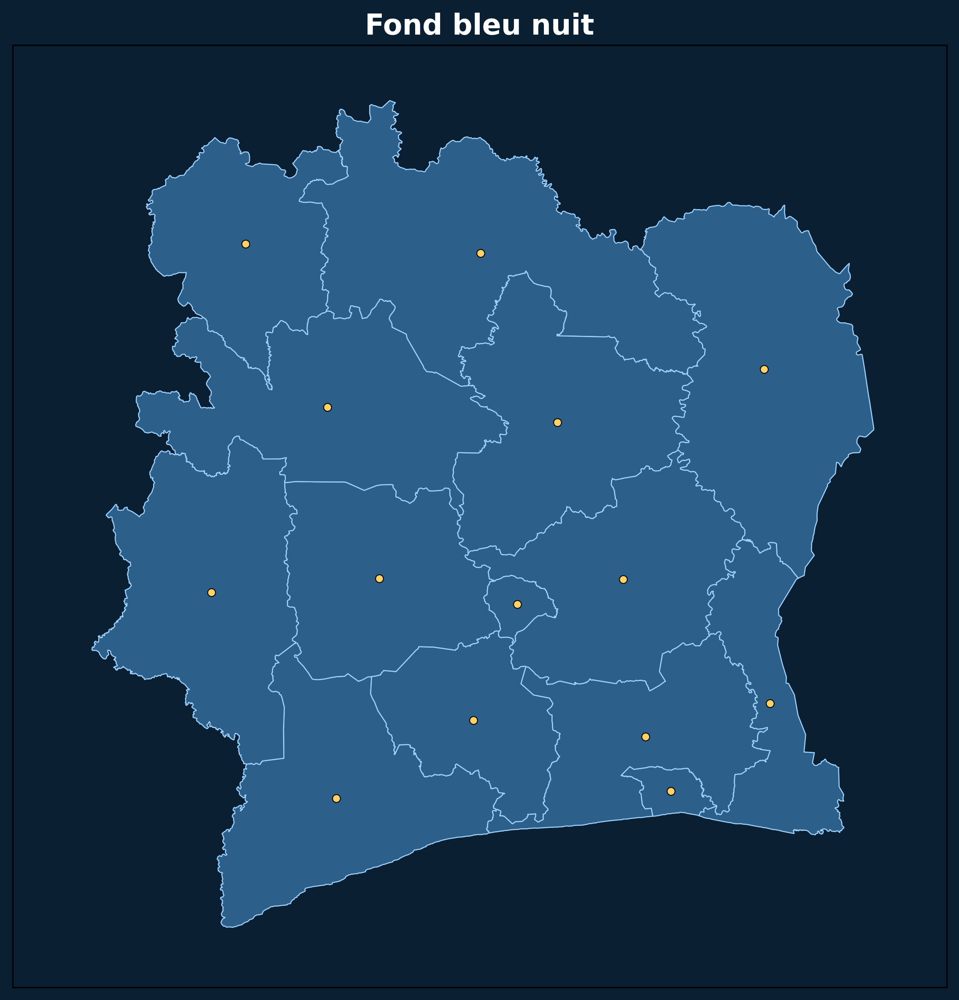

In [20]:
m = cp.Map(figsize=(8, 8), title="Fond bleu nuit", basemap=False)
m.set_background_color("#0b1f33")
m.add_polygons(regions, facecolor="#2c5f8a", edge_color="#9fd3ff", linewidth=0.6, alpha=1)
m.add_points(centres, color="#ffd166", size=20)
m.ax.title.set_color("white")
m.set_extent(CIV_EXTENT)
m.show()

## 20. Ajouter des flèches libres

`add_fig_arrow(tail, head, radius)` trace une flèche en coordonnées figure
(0–1), par-dessus tout — pratique pour pointer une petite entité.

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


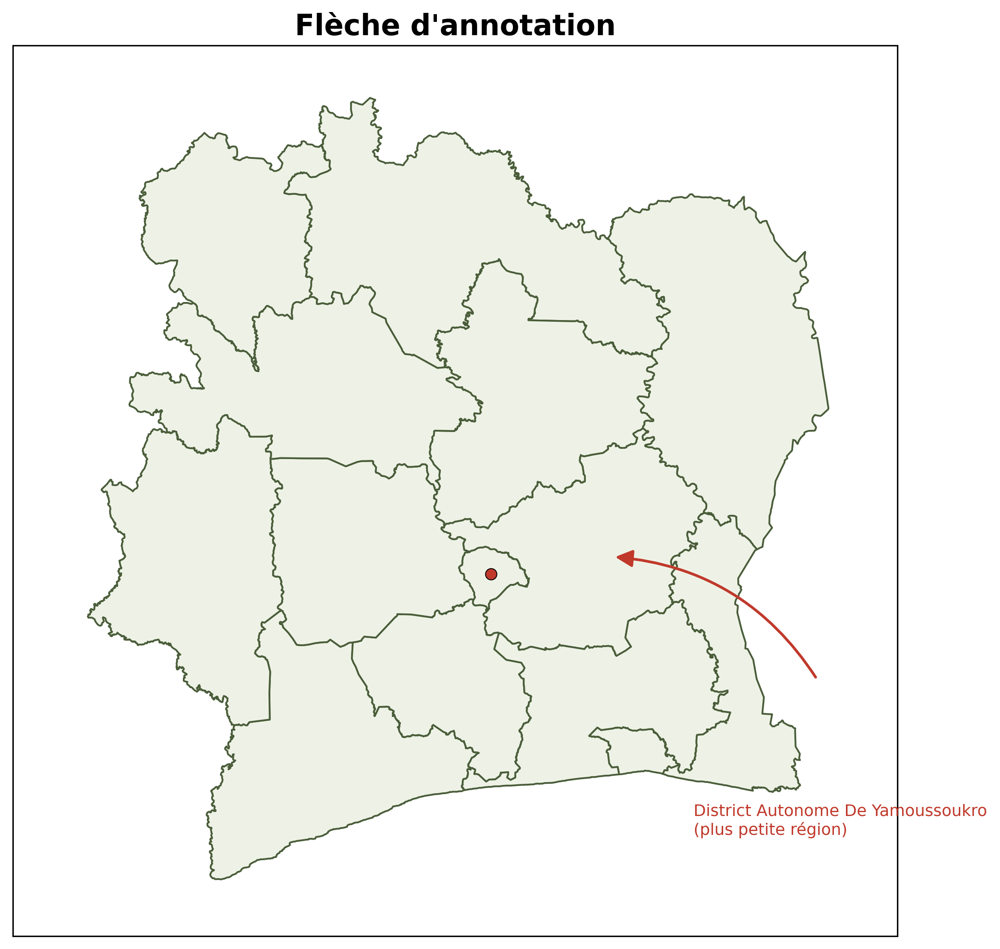

In [21]:
petite = centres.nsmallest(1, "aire_km2")   # la plus petite région

m = cp.Map(figsize=(8, 8), title="Flèche d'annotation", basemap=False)
m.add_polygons(regions, facecolor="#eef2e6", edge_color="#4a5d3a", alpha=1)
m.add_points(petite, color="#c0392b", size=40)
m.set_extent(CIV_EXTENT)
try:
    m.add_fig_arrow((0.80, 0.30), (0.60, 0.42), radius=0.25, color="#c0392b", width=1.5)
except Exception as err:
    print("add_fig_arrow indisponible :", err)
m.add_text(f"{petite.iloc[0]['shapeName']}\n(plus petite région)", xy=(-3.6, 4.7),
           fontsize=9, color="#c0392b")
m.show()

## 21. Modifier le style graphique

`cp.set_style(nom, source=...)` applique un thème matplotlib / seaborn /
`mplcyberpunk` / `SciencePlots`. Le style est **global** : on le
réinitialise après avec `plt.style.use("default")`.

✅ Style mplcyberpunk appliqué : cyberpunk


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.95


   Étendue: [-9.18, -1.90, 3.91, 11.19]


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


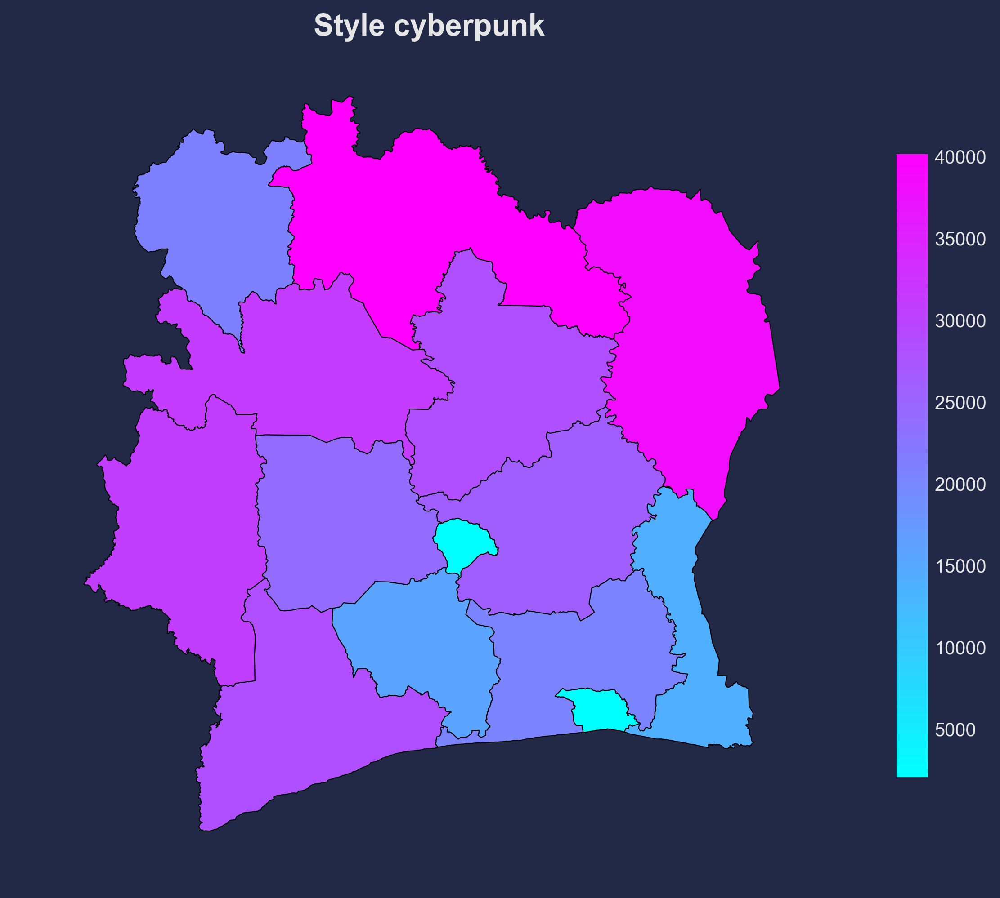

In [22]:
cp.set_style("cyberpunk", source="mplcyberpunk")
m = cp.Map(figsize=(8, 8), title="Style cyberpunk", basemap=False)
m.add_polygons_choropleth(regions, column_to_plot="aire_km2", cmap="cool", show_labels=False)
m.set_extent(CIV_EXTENT)
m.show()

plt.style.use("default")   # réinitialisation pour les cellules suivantes

## 22. Palettes de couleurs

`cp.get_available_palettes()` regroupe les familles de palettes
(matplotlib, seaborn, pypalettes…). `cp.load_cmap(nom)` renvoie une
colormap ; `add_polygons_choropleth` / `add_points` acceptent directement
un nom de palette matplotlib **ou** pypalettes (ex. `atomic_clock`).

familles de palettes : ['custom', 'seaborn_qualitative', 'seaborn_sequential', 'seaborn_diverging', 'matplotlib_sequential', 'matplotlib_diverging', 'matplotlib_cyclic', 'matplotlib_qualitative']
📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.95


   Étendue: [-9.18, -1.90, 3.91, 11.19]


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


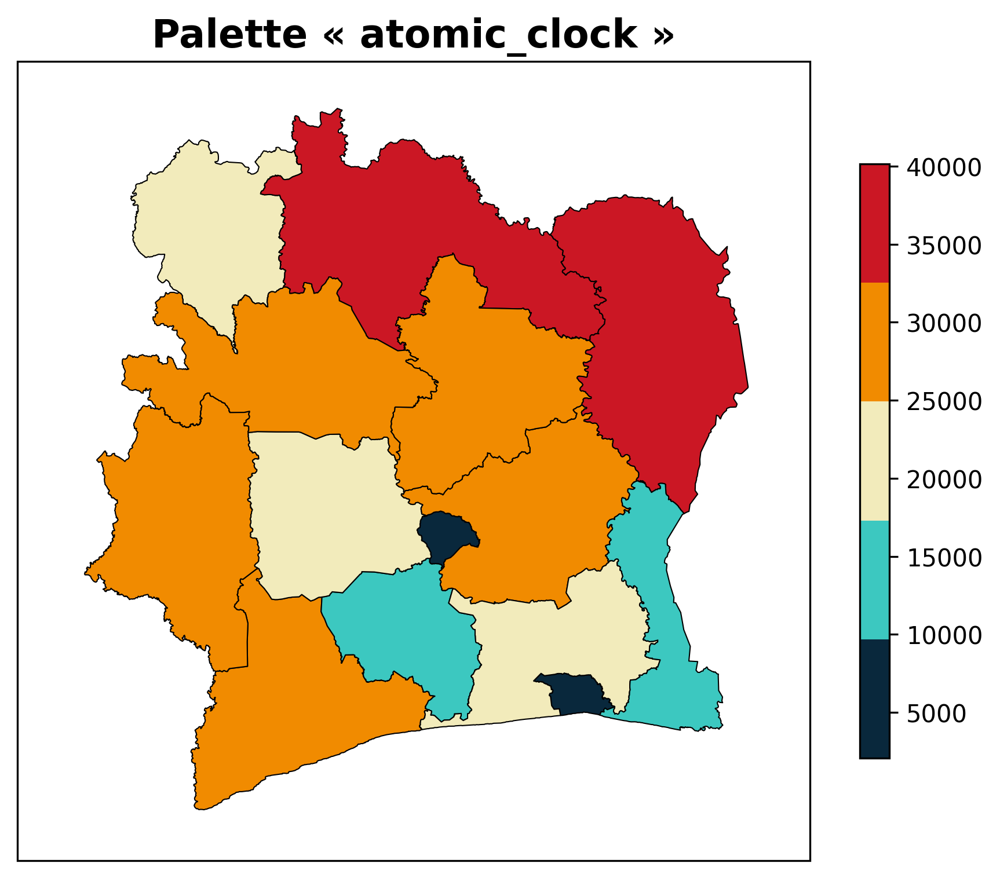

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.95


   Étendue: [-9.18, -1.90, 3.91, 11.19]


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


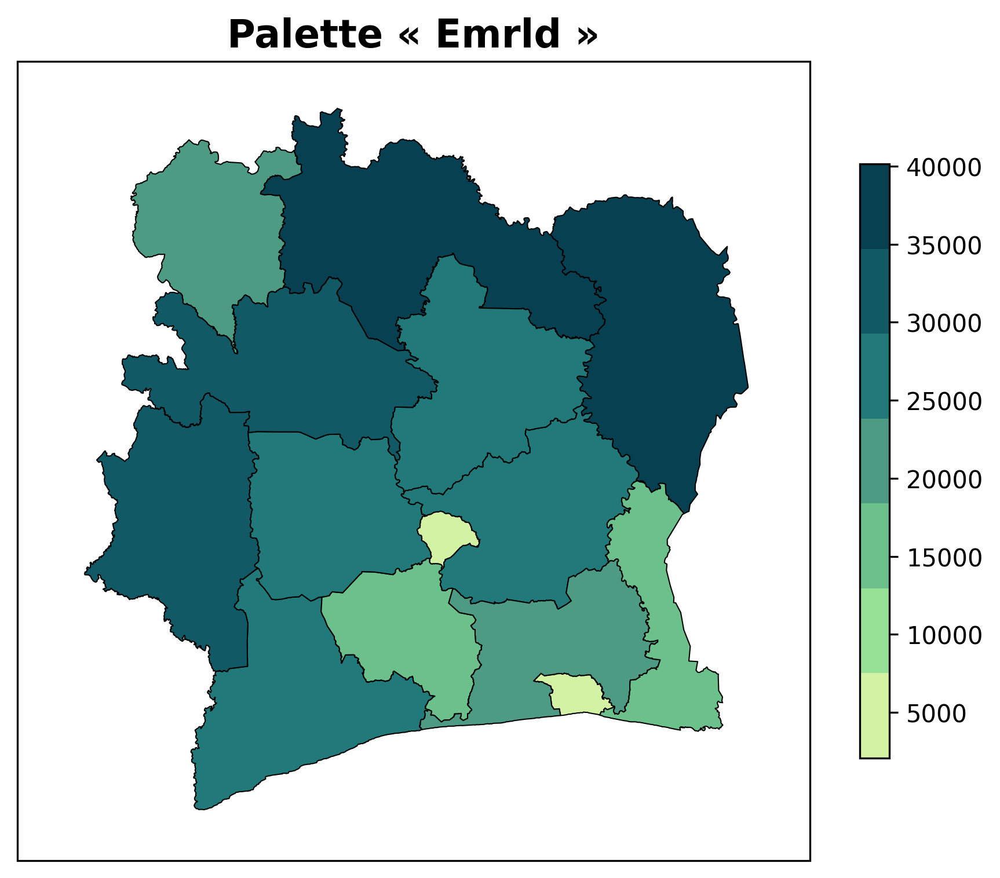

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.95


   Étendue: [-9.18, -1.90, 3.91, 11.19]


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


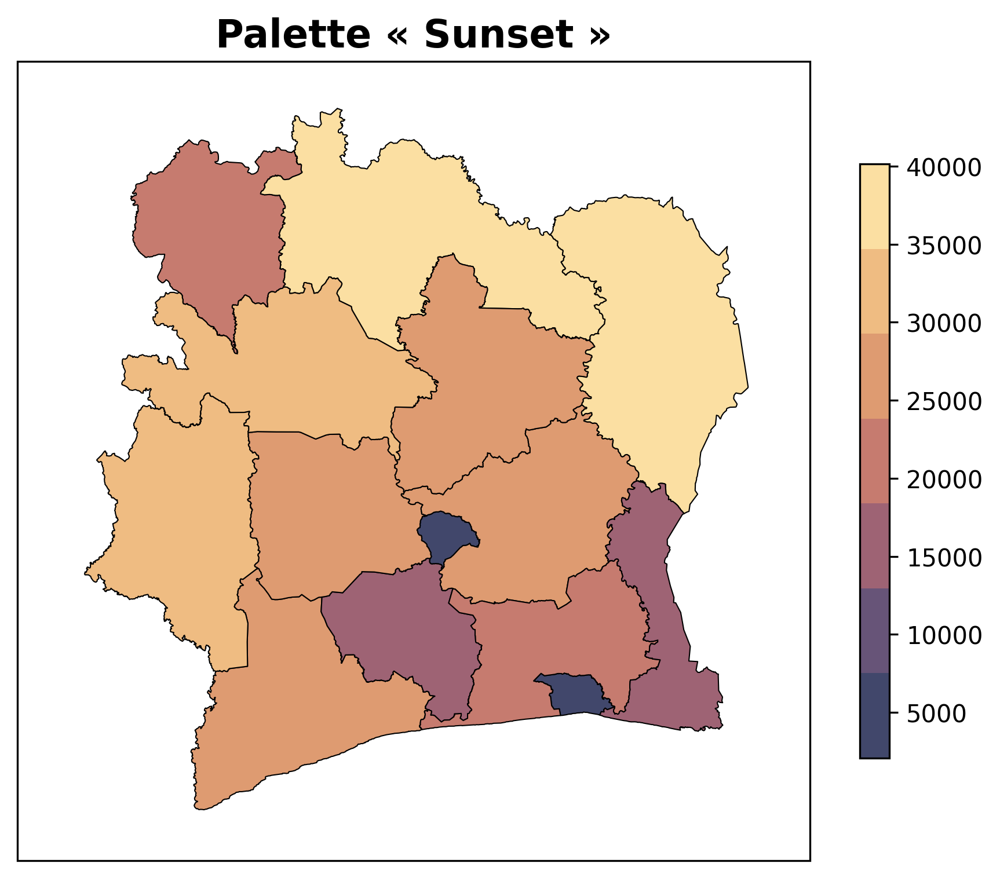

In [23]:
print("familles de palettes :", list(cp.get_available_palettes()))

for pal in ["atomic_clock", "Emrld", "Sunset"]:
    try:
        m = cp.Map(figsize=(6, 6), title=f"Palette « {pal} »", basemap=False)
        m.add_polygons_choropleth(regions, column_to_plot="aire_km2", cmap=pal, show_labels=False)
        m.set_extent(CIV_EXTENT)
        m.show()
    except Exception as err:
        print(f"palette {pal} indisponible :", err)

## 23. Modifier les polices

`cp.google_font(famille, weight=...)` renvoie un `FontProperties`
utilisable sur le titre, `add_text(..., fontproperties=...)`,
`add_scale_bar(font=...)`, `add_labels(...)`.

📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.95


   Étendue: [-9.18, -1.90, 3.91, 11.19]


📊 Centrage intelligent appliqué:


   Format: Personnalisé (N/A)


   Ratio figure: 1.00


   Ratio données: 0.96


   Étendue: [-9.20, -1.92, 3.90, 11.17]


C:\Users\Ordinateur\OneDrive\cartograpy\cartograpy\mapper\map.py:5810: RuntimeWarning: font= n'est pas supporté en mode 'map-utils' (matplotlib-map-utils n'accepte qu'une famille CSS générique via labels={'fontfamily': ...}) ; bascule vers style='scalebar' pour appliquer la police demandée.
  self._draw_scale_bar(**layer["params"])
C:\Users\Ordinateur\OneDrive\cartograpy\.venv\Lib\site-packages\matplotlib_scalebar\scalebar.py:457: UserWarning: Drawing scalebar on axes with unequal aspect ratio; either call ax.set_aspect(1) or suppress the warning with rotation='horizontal-only'.
  warnings.warn(
C:\Users\Ordinateur\OneDrive\cartograpy\.venv\Lib\site-packages\matplotlib_scalebar\scalebar.py:457: UserWarning: Drawing scalebar on axes with unequal aspect ratio; either call ax.set_aspect(1) or suppress the warning with rotation='horizontal-only'.
  warnings.warn(


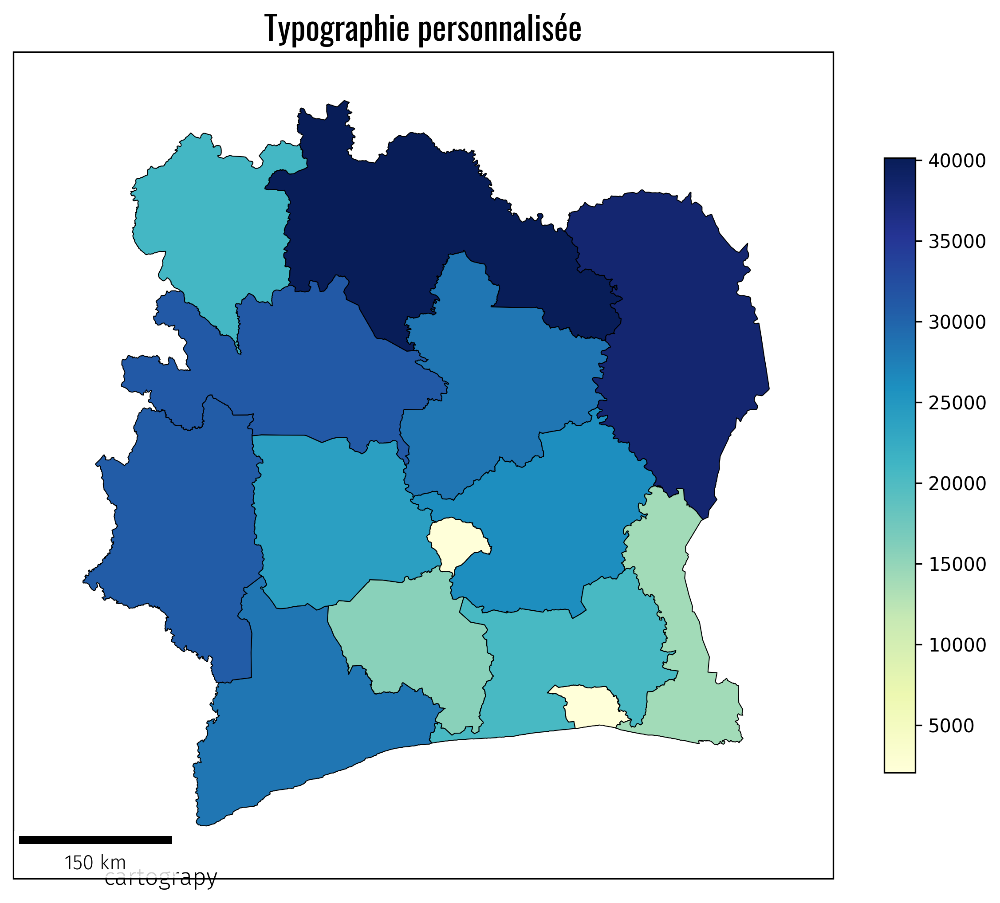

In [24]:
try:
    titre = cp.google_font("Oswald")
    texte = cp.google_font("Fira Sans", weight="light")
except Exception as err:
    titre = texte = None
    print("google_font indisponible (hors ligne) :", err)

m = cp.Map(figsize=(8, 8), title="Typographie personnalisée", basemap=False)
m.add_polygons_choropleth(regions, column_to_plot="aire_km2", cmap="YlGnBu", show_labels=False)
m.add_scale_bar(font=texte)
if titre is not None:
    m.ax.title.set_fontproperties(titre)
    m.ax.title.set_fontsize(18)
m.add_text("cartograpy", xy=(-8.4, 3.8), fontsize=13,
           **({"fontproperties": texte} if texte else {}))
m.set_extent(CIV_EXTENT)
m.show()

## 24. Rendu en différents formats

`save(chemin, dpi=...)` : l'extension choisit le format — `.png` (raster,
règle `dpi`), `.svg` / `.pdf` (vectoriel). Avec un `figsize` de format
papier, on obtient une planche prête à imprimer.

📄 Format de papier: A4 (landscape) - Dimensions: 297 x 210 mm - Figure: 11.7" x 8.3"


📊 Centrage intelligent appliqué:


   Format: A4 (landscape)


   Ratio figure: 1.41


   Ratio données: 0.94


   Étendue: [-22.93, 12.07, 2.29, 27.04]


🧭 Flèche du Nord ajoutée (map-utils)


📊 Centrage intelligent appliqué:


   Format: A4 (landscape)


   Ratio figure: 1.41


   Ratio données: 0.96


   Étendue: [-10.98, -0.15, 3.71, 11.36]


C:\Users\Ordinateur\OneDrive\cartograpy\.venv\Lib\site-packages\matplotlib_map_utils\core\scale_bar.py:781: UserWarning: Provided CRS EPSG:4326 uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.
  warnings.warn(f"Provided CRS {bar_projection} uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.")
C:\Users\Ordinateur\OneDrive\cartograpy\.venv\Lib\site-packages\matplotlib_map_utils\core\scale_bar.py:781: UserWarning: Provided CRS EPSG:4326 uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.
  warnings.warn(f"Provided CRS {bar_projection} uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.")


Carte sauvegardée: _cartes/civ_regions.png


📊 Centrage intelligent appliqué:


   Format: A4 (landscape)


   Ratio figure: 1.41


   Ratio données: 0.96


   Étendue: [-10.98, -0.15, 3.71, 11.36]


C:\Users\Ordinateur\OneDrive\cartograpy\.venv\Lib\site-packages\matplotlib_map_utils\core\scale_bar.py:781: UserWarning: Provided CRS EPSG:4326 uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.
  warnings.warn(f"Provided CRS {bar_projection} uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.")
C:\Users\Ordinateur\OneDrive\cartograpy\.venv\Lib\site-packages\matplotlib_map_utils\core\scale_bar.py:781: UserWarning: Provided CRS EPSG:4326 uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.
  warnings.warn(f"Provided CRS {bar_projection} uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.")


Carte sauvegardée: _cartes/civ_regions.svg


📊 Centrage intelligent appliqué:


   Format: A4 (landscape)


   Ratio figure: 1.41


   Ratio données: 0.96


   Étendue: [-10.98, -0.15, 3.71, 11.36]


C:\Users\Ordinateur\OneDrive\cartograpy\.venv\Lib\site-packages\matplotlib_map_utils\core\scale_bar.py:781: UserWarning: Provided CRS EPSG:4326 uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.
  warnings.warn(f"Provided CRS {bar_projection} uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.")


C:\Users\Ordinateur\OneDrive\cartograpy\.venv\Lib\site-packages\matplotlib_map_utils\core\scale_bar.py:781: UserWarning: Provided CRS EPSG:4326 uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.
  warnings.warn(f"Provided CRS {bar_projection} uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.")


Carte sauvegardée: _cartes/civ_regions.pdf


['_probe.png', '_probe2.png', '_probe3.png', '_probe4.png', '_probe5.png', '_probe6.png', 'civ_regions.pdf', 'civ_regions.png', 'civ_regions.svg', 'drnouf_occupation_sol.png', 'drnouf_topographie_tampon.png']


C:\Users\Ordinateur\OneDrive\cartograpy\.venv\Lib\site-packages\matplotlib_map_utils\core\scale_bar.py:781: UserWarning: Provided CRS EPSG:4326 uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.
  warnings.warn(f"Provided CRS {bar_projection} uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.")
C:\Users\Ordinateur\OneDrive\cartograpy\.venv\Lib\site-packages\matplotlib_map_utils\core\scale_bar.py:781: UserWarning: Provided CRS EPSG:4326 uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.
  warnings.warn(f"Provided CRS {bar_projection} uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.")


C:\Users\Ordinateur\OneDrive\cartograpy\.venv\Lib\site-packages\matplotlib_map_utils\core\scale_bar.py:781: UserWarning: Provided CRS EPSG:4326 uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.
  warnings.warn(f"Provided CRS {bar_projection} uses degrees. An attempt will be made at conversion, but there will be accuracy issues: it is recommended that you use a projected CRS instead.")


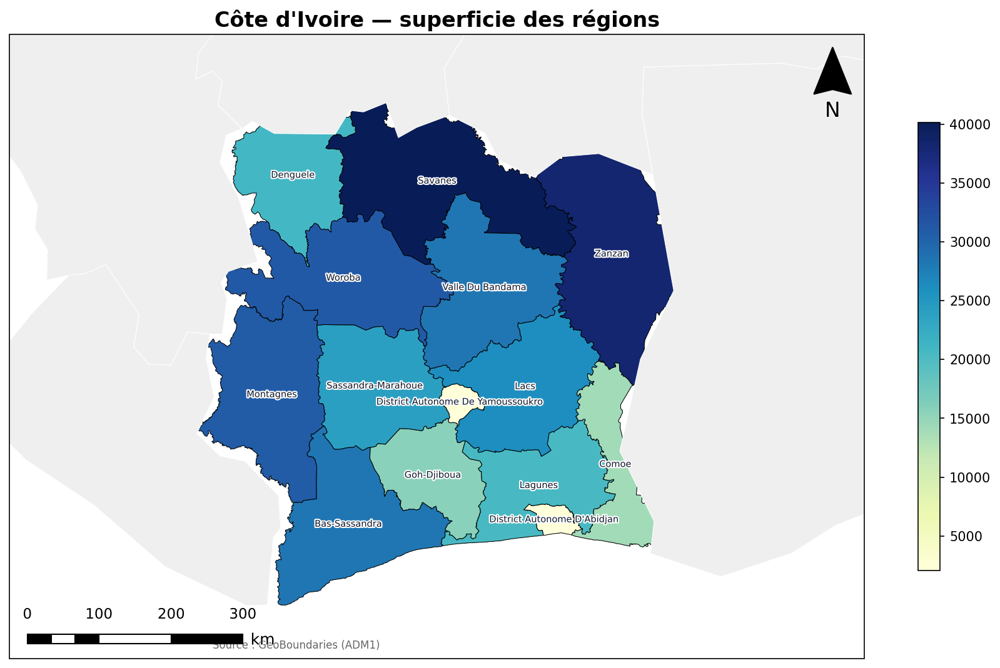

In [25]:
Path("_cartes").mkdir(exist_ok=True)

carte = cp.Map(figsize={"paper": "A4", "orientation": "landscape"},
               title="Côte d'Ivoire — superficie des régions", dpi=150, basemap=False)
carte.add_polygons(voisins, facecolor="#efefef", edge_color="white", linewidth=0.5, alpha=1)
carte.add_polygons_choropleth(regions, column_to_plot="aire_km2", cmap="YlGnBu", show_labels=False)
carte.add_labels(regions, label_column="shapeName", fontsize=7)
carte.add_north_arrow()
carte.add_scale_bar()
carte.add_text("Source : GeoBoundaries (ADM1)", xy=(-8.4, 3.8), fontsize=8, color="#666666")
carte.set_extent(CIV_EXTENT)

for ext in ("png", "svg", "pdf"):
    carte.save(f"_cartes/civ_regions.{ext}", dpi=300)

print(sorted(p.name for p in Path("_cartes").iterdir()))